# Importing the libraries

In [9]:
import pandas as pd
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import numpy as np
import scipy.stats as st

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Source of the dataset

The  source dataset downloaded from [Kaggle](https://www.kaggle.com/datasets/lachmann12/human-liver-rnaseq-gene-expression-903-samples) repository has  total gene expression contained within ARCHS4. Specifically, this data only contains gene counts of  samples matching human liver samples. From the column **Geo_accession number**  of the samples  the total samplemetadata  has been collected  by [R code](https://moha-cm.github.io/GEO_accession/).

This notebook is about data cleaning and understanding the data of the two sounrce files(samples_metadata,gene_counts).

# Loading the dataset

In [10]:
samples_df =pd.read_csv("samples_metadata.csv")

In [11]:
samples_df.head()

,Geo_accession,Source,Series_id,Platform_id,Organism,Molecule,Library_strategy,Library_source,Library_selection,Submission_date,Title,Data_row_count,Contact_country,Contact_city,Institute
0,GSM2142335,17 week humn fetal liver sorted form haematopo...,GSE81080,GPL11154,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,May 03 2016,FL_HSPC,0,Australia,Parkville,WEHI
1,GSM1662558,292-Liver-KRAS,GSE68086,GPL16791,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,Apr 21 2015,Blood_Platelets_Chol-292,0,Netherlands,Amsterdam,VU University Medical Center
2,GSM1662702,297-Liver-WT,GSE68086,GPL16791,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,Apr 21 2015,Blood_Platelets_Liver-297,0,Netherlands,Amsterdam,VU University Medical Center
3,GSM1662559,316-Liver-KRAS,GSE68086,GPL16791,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,Apr 21 2015,Blood_Platelets_Chol-316,0,Netherlands,Amsterdam,VU University Medical Center
4,GSM1662560,341-Liver-WT,GSE68086,GPL16791,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,Apr 21 2015,Blood_Platelets_Chol-341,0,Netherlands,Amsterdam,VU University Medical Center


The head function in pandas gives the  fives rows in the dataframe

# Shape of the dataframe

In [12]:
shape = samples_df.shape

print("The Total rows(samples) :",shape[0])
print("The Total columns(genes) :",shape[1])

The Total rows(samples) : 903
The Total columns(genes) : 15


# Columns in the dataframe

In [13]:
samples_df.columns

Index(['Geo_accession', 'Source', 'Series_id', 'Platform_id', 'Organism',
       'Molecule', 'Library_strategy', 'Library_source', 'Library_selection',
       'Submission_date', 'Title', 'Data_row_count', 'Contact_country',
       'Contact_city', 'Institute'],
      dtype='object')

In [14]:
samples_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 903 entries, 0 to 902
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Geo_accession      903 non-null    object
 1   Source             903 non-null    object
 2   Series_id          903 non-null    object
 3   Platform_id        903 non-null    object
 4   Organism           903 non-null    object
 5   Molecule           903 non-null    object
 6   Library_strategy   903 non-null    object
 7   Library_source     903 non-null    object
 8   Library_selection  903 non-null    object
 9   Submission_date    903 non-null    object
 10  Title              903 non-null    object
 11  Data_row_count     903 non-null    int64 
 12  Contact_country    903 non-null    object
 13  Contact_city       903 non-null    object
 14  Institute          903 non-null    object
dtypes: int64(1), object(14)
memory usage: 105.9+ KB


From the above output, the sample_metadata has a **rows of 902** and **columns of 15**. It also explains the datatype of each colums and the non- null values count

# Counts of null value

In [15]:
def count_na(dataframe,col_names):
    count = {}
    for i in col_names:
        value = dataframe[i].isna().sum()
        count[i]= value

    dataframe = pd.DataFrame([count])
    return dataframe

count_na(samples_df,samples_df.columns)

,Geo_accession,Source,Series_id,Platform_id,Organism,Molecule,Library_strategy,Library_source,Library_selection,Submission_date,Title,Data_row_count,Contact_country,Contact_city,Institute
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


The function **count_na** is used for counting the null values in the given dataframe and return  the output for count of null values   as a dataframe 

# Getting the unique values

In [16]:
def count_unique(dataframe,col_names):
    count = {}
    for i in col_names:
        value = len(dataframe[i].unique().tolist())
        count[i]= value
    dataframe = pd.DataFrame([count])
    return dataframe
count_unique(samples_df,samples_df.columns)

,Geo_accession,Source,Series_id,Platform_id,Organism,Molecule,Library_strategy,Library_source,Library_selection,Submission_date,Title,Data_row_count,Contact_country,Contact_city,Institute
0,903,69,60,5,1,3,1,2,1,57,903,1,16,43,49


The above function count_unique is used for count the unique values in the given dataframe and return the output for count of unique values as a dataframe

In [17]:
samples_df["Source"].value_counts()

Human_fetal_liver    206
liver bud            174
Human_adult_liver     93
Liver                 56
liver biopsy          46
                    ... 
366-Liver-WT           1
341-Liver-WT           1
316-Liver-KRAS         1
297-Liver-WT           1
Whole liver            1
Name: Source, Length: 69, dtype: int64

This  gives the counts of each values in the source column.

# Bar plots for categorical values

In [18]:
col = ['Platform_id','Organism', 'Molecule', 'Library_strategy','Library_source', 'Library_selection','Data_row_count','Contact_country']


The below function is for ploting the value counts of each column in the dataframe

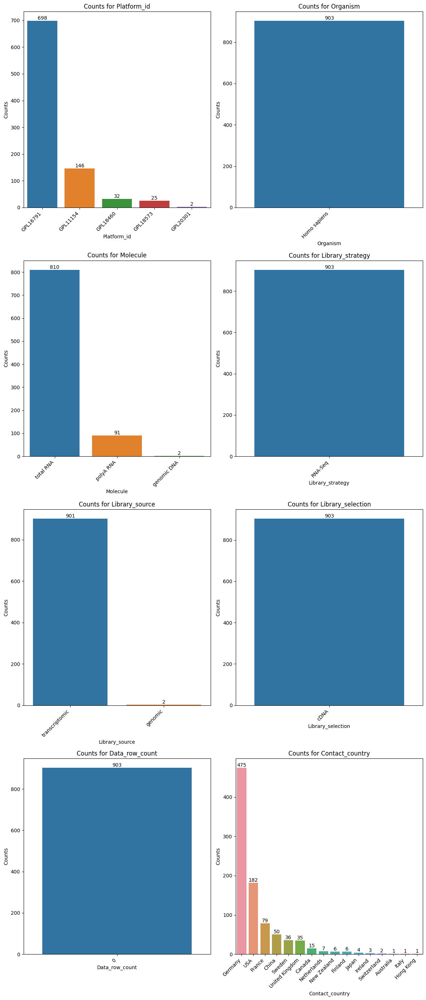

In [19]:
def total_count(dataframes, col_name):

    value_counts = dataframes[col_name].value_counts()
    result_list = []
    for value, count in value_counts.items():
        result_list.append({col_name: value, "Counts": count})
    result_df = pd.DataFrame(result_list)

    return result_df


def subplots_bar(columns,dataframe):
    num_columns = len(columns)
    size = len(columns) // 2 + len(columns) % 2
    fig, axes = plt.subplots(size, 2, figsize=(12, 7 * size))
    axes = axes.flatten()
    for i, col in enumerate(columns):
        counts_df = total_count(dataframe, col)

        ax = sns.barplot(data=counts_df, x=col, y="Counts", ax=axes[i])
        ax.set_xlabel(col)
        ax.set_ylabel("Counts")
        ax.bar_label(ax.containers[0], fontsize=10)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.set_title(f"Counts for {col}")

    if num_columns % 2 != 0:
      fig.delaxes(axes[-1])
    plt.tight_layout()
    plt.show()

subplots_bar(col,samples_df)

# Loading the gene_counts 

In [20]:
gene_df =pd.read_csv("genes_counts.csv")

In [21]:
gene_df.head()

,Unnamed: 0,A1BG,A1CF,A2M,A2ML1,A2MP1,A3GALT2,A4GALT,A4GNT,AAAS,...,BP-21201H5.1,BP-21264C1.1,BP-2168N6.1,BP-2168N6.3,BP-2171C21.2,BP-2171C21.4,BP-2171C21.5,BP-2171C21.6,BP-2189O9.2,YR211F11.2
0,GSM742944,0,0,6362,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,GSM2326089,92,17,304,22,3,0,422,20,2319,...,3.0,17.0,0.0,0.0,0.0,0.0,0.0,4.0,25.0,0.0
2,GSM1807974,11663,5738,39269,11,167,1,78,4,593,...,0.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,6.0,0.0
3,GSM1807990,2089,490,8299,2,7,0,0,1,13,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,GSM2055788,18808,14035,20260,39,44,0,69,3,237,...,24.0,38.0,0.0,0.0,3.0,0.0,8.0,1.0,48.0,0.0


In [22]:
shape = gene_df.shape

print("The Total rows(samples) :",shape[0])
print("The Total columns(genes) :",shape[1])

The Total rows(samples) : 84
The Total columns(genes) : 35239


# Renaming the column

In [23]:
col_name = {"Unnamed: 0":"Geo_accession"}

gene_df = gene_df.rename(columns=col_name)

In [24]:
# Printing the columns in the dataframe
gene_df.columns

Index(['Geo_accession', 'A1BG', 'A1CF', 'A2M', 'A2ML1', 'A2MP1', 'A3GALT2',
       'A4GALT', 'A4GNT', 'AAAS',
       ...
       'BP-21201H5.1', 'BP-21264C1.1', 'BP-2168N6.1', 'BP-2168N6.3',
       'BP-2171C21.2', 'BP-2171C21.4', 'BP-2171C21.5', 'BP-2171C21.6',
       'BP-2189O9.2', 'YR211F11.2'],
      dtype='object', length=35239)

# Getting the shape of the dataframe

In [25]:
gene_df.shape

(84, 35239)

# Transposing the dataframe

In the genes_dataframe it has a **35239 genes columns and 41 sample rows**. In  bulk RNA -seq  the genes are correlted between the different samples to see how the genes are expressed in diffrent samples. Based on this, the dataframe has been transposed , the output  shape of this dataframe be **41 sample columns and 35239 genes rows**.

In [26]:
a = gene_df.T
a.columns = a.iloc[0]
a = a.iloc[1:]
print(a.columns)

Index(['GSM742944', 'GSM2326089', 'GSM1807974', 'GSM1807990', 'GSM2055788',
       'GSM2142335', 'GSM1807979', 'GSM1695909', 'GSM1554468', 'GSM1695910',
       'GSM1807975', 'GSM1807977', 'GSM1807985', 'GSM1417183', 'GSM1807992',
       'GSM1505572', 'GSM1807991', 'GSM1807996', 'GSM1416804', 'GSM2055782',
       'GSM1807988', 'GSM1807981', 'GSM1807993', 'GSM1505598', 'GSM1807984',
       'GSM1807973', 'GSM1807987', 'GSM1417184', 'GSM1807983', 'GSM1807982',
       'GSM1807976', 'GSM1807980', 'GSM1807995', 'GSM1807994', 'GSM1807978',
       'GSM2326088', 'GSM1807989', 'GSM1622386', 'GSM2199518', 'GSM1548454',
       'GSM1707675', 'GSM2113310', 'GSM1548461', 'GSM1548457', 'GSM1548466',
       'GSM1548460', 'GSM1548459', 'GSM1662561', 'GSM2199516', 'GSM1548455',
       'GSM1662562', 'GSM2199514', 'GSM2199513', 'GSM1662703', 'GSM2199520',
       'GSM2199519', 'GSM1662560', 'GSM2127797', 'GSM2199511', 'GSM1548463',
       'GSM2113305', 'GSM2199512', 'GSM1662559', 'GSM1548465', 'GSM2199509',


# Counts of null value

In [27]:
def count_na(dataframe,col_names):
    count = {}
    for i in col_names:
        value = dataframe[i].isna().sum()
        count[i]= value
    dataframe = pd.DataFrame([count])
    return dataframe

count_na(a,a.columns)

,GSM742944,GSM2326089,GSM1807974,GSM1807990,GSM2055788,GSM2142335,GSM1807979,GSM1695909,GSM1554468,GSM1695910,...,GSM1662702,GSM1960357,GSM1548458,GSM1548464,GSM2199510,GSM1960356,GSM2199515,GSM1417182,GSM1505571,GSM1554467
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,7470


# Getting the shape of the dataframe

In [28]:
shape = a.shape

print("no_of_rows :",shape[0])
print("no_of_columns :",shape[1])

no_of_rows : 35238
no_of_columns : 84


In [29]:
a = a.dropna()

# changing the datatype

In [30]:
a = a.astype(int)

# Plot for understanding the data distribution

For understanding the numerical data, the histogram and violin plot is used  for plot the data for each samples to understand how the data is distributed . 

**Violin plot** - It  is a hybrid of a box plot and a kernel density plot, which shows peaks in the data. It is used to visualize the distribution of numerical data. Unlike a box plot that can only show summary statistics, violin plots depict summary statistics and the density of each variable.

**Histogram Plot** -  used to visualize the distribution of numerical data. When exploring a dataset, to get a quick understanding of the distribution of certain numerical variables within it.histogram divides the values within a numerical variable into “bins”, and counts the number of observations that fall into each bin. By visualizing these binned counts in a columnar fashion, hepls to  obtain a very immediate and intuitive sense of the distribution of values within a variable.

<img src="a1both.png" alt="pic" width="800" height="800">

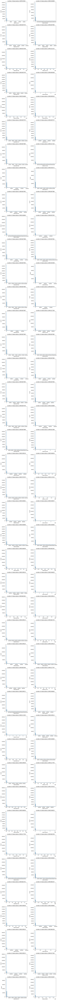

In [31]:
def subplots_his(columns,dataframe):
    num_columns = len(columns)
    size = len(columns) // 2 + len(columns) % 2
    fig, axes = plt.subplots(size, 2, figsize=(10, 4 * size))
    axes = axes.flatten()

    for i, col in enumerate(columns):
        sns.histplot(data=dataframe, x=col, kde=True,bins=40,edgecolor='black',ax=axes[i]).set_title(f' number of observations {col}')


    if num_columns % 2 != 0:
        fig.delaxes(axes[-1])

    plt.tight_layout()
    plt.show()

subplots_his(a.columns,a)



# Violen Plot

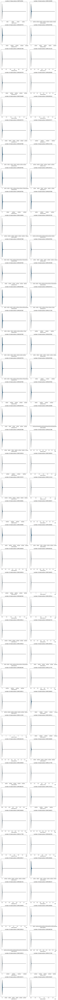

In [32]:
def subplots_violen(columns,dataframe):
    #size = len(columns) // 2
    num_columns = len(columns)
    size = len(columns) // 2 + len(columns) % 2
    fig, axes = plt.subplots(size, 2, figsize=(10, 4 * size))
    axes = axes.flatten()

    for i, col in enumerate(columns):
      sns.violinplot(x=dataframe[col],ax=axes[i]).set_title(f' number of observations {col}')


    if num_columns % 2 != 0:
        fig.delaxes(axes[-1])

    plt.tight_layout()
    plt.show()

subplots_violen(a.columns,a)


# Handling the skewness

## 1.Log Transform

In [33]:
def log_transform(col_values):
    return np.log(col_values[col_values > 0])


columns_to_transform = a.columns.to_list()


df_log=a
for column in columns_to_transform:
    df_log[column] = log_transform(df_log[column])

df_log.head()

Geo_accession,GSM742944,GSM2326089,GSM1807974,GSM1807990,GSM2055788,GSM2142335,GSM1807979,GSM1695909,GSM1554468,GSM1695910,...,GSM1662702,GSM1960357,GSM1548458,GSM1548464,GSM2199510,GSM1960356,GSM2199515,GSM1417182,GSM1505571,GSM1554467
A1BG,NaN,4.521789,9.364177,7.644441,9.842038,5.209486,8.541495,11.285272,7.374629,10.075801,...,3.135494,9.254357,11.399286,5.545177,8.908154,10.002518,9.424645,6.891626,5.484797,7.291656
A1CF,NaN,2.833213,8.654866,6.194405,9.549309,1.609438,8.871646,9.227001,5.484797,9.281544,...,1.791759,8.957382,9.328923,7.899524,7.210818,9.019543,7.708860,7.240650,4.852030,5.505332
A2M,8.758098,5.717028,10.578191,9.023890,9.916404,4.574711,10.211340,11.055593,8.668540,11.352604,...,4.543295,10.766842,11.411380,8.041413,9.749928,11.339405,8.690474,7.716906,9.421978,8.678802
A2ML1,NaN,3.091042,2.397895,0.693147,3.663562,2.079442,1.386294,2.197225,1.609438,3.465736,...,1.098612,2.397895,1.609438,2.302585,1.098612,3.850148,1.386294,3.688879,2.772589,1.386294
A2MP1,NaN,1.098612,5.117994,1.945910,3.784190,2.708050,2.772589,4.110874,0.693147,6.182085,...,NaN,4.605170,5.147494,2.944439,3.496508,3.891820,3.951244,2.397895,7.587311,1.098612


# Count the  null values

In [34]:
count_na(df_log,df_log.columns)

,GSM742944,GSM2326089,GSM1807974,GSM1807990,GSM2055788,GSM2142335,GSM1807979,GSM1695909,GSM1554468,GSM1695910,...,GSM1662702,GSM1960357,GSM1548458,GSM1548464,GSM2199510,GSM1960356,GSM2199515,GSM1417182,GSM1505571,GSM1554467
0,24717,11126,12882,18291,10430,12874,14236,12339,14315,10836,...,16873,11253,12340,11772,14757,11228,14038,10154,14638,14275


In [35]:
# Dropping the null values
df_log = df_log.dropna()

In [36]:
df_log.describe()

Geo_accession,GSM742944,GSM2326089,GSM1807974,GSM1807990,GSM2055788,GSM2142335,GSM1807979,GSM1695909,GSM1554468,GSM1695910,...,GSM1662702,GSM1960357,GSM1548458,GSM1548464,GSM2199510,GSM1960356,GSM2199515,GSM1417182,GSM1505571,GSM1554467
count,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,...,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000
mean,3.017218,7.886005,6.788055,4.059048,6.614022,6.646929,6.068522,7.054270,5.439181,7.764903,...,4.522883,6.297752,7.307821,6.821493,5.098770,6.683875,5.553030,6.535346,4.207418,5.452467
std,1.533545,1.440100,1.066879,1.849603,1.008868,1.327367,1.202363,1.201119,1.184331,0.986207,...,1.800503,1.020927,1.048819,1.057404,1.104877,1.015081,1.122660,1.041522,2.035459,1.200163
min,0.000000,0.693147,1.791759,0.000000,2.079442,0.693147,0.000000,2.484907,0.693147,4.189655,...,0.000000,2.484907,3.583519,2.484907,0.693147,2.484907,1.791759,2.079442,0.000000,0.000000
25%,1.945910,7.373374,6.194405,3.044522,5.945421,6.011267,5.433722,6.345636,4.727388,7.153834,...,3.465736,5.627621,6.621406,6.190315,4.418841,6.013715,4.882802,5.863631,2.890372,4.736198
50%,2.995732,8.074649,6.869014,4.330733,6.613384,6.746412,6.226537,7.055313,5.455321,7.780303,...,4.499810,6.272877,7.320527,6.910751,5.105945,6.673298,5.564520,6.504288,3.713572,5.497168
75%,4.043051,8.715716,7.437206,5.389072,7.255591,7.510978,6.829794,7.786967,6.192362,8.381603,...,5.552960,6.934397,8.002694,7.506042,5.814131,7.330405,6.284134,7.165493,4.990433,6.224558
max,8.068403,11.664315,9.876476,8.883363,11.770625,10.109810,9.600895,12.081660,9.406236,11.248296,...,11.206427,11.811251,11.763124,10.083055,9.859170,12.157014,10.705668,10.874834,11.652044,9.445017


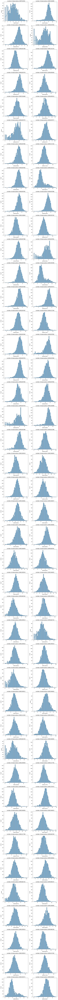

In [37]:
def subplots_hist(columns,dataframe):

    num_columns = len(columns)
    size = len(columns) // 2 + len(columns) % 2
    fig, axes = plt.subplots(size, 2, figsize=(10, 4 * size))
    axes = axes.flatten()

    for i, col in enumerate(columns):
      sns.histplot(data=dataframe, x=col, kde=True,bins=40,edgecolor='black',ax=axes[i]).set_title(f' number of observations {col}')



    if num_columns % 2 != 0:
        fig.delaxes(axes[-1])

    plt.tight_layout()
    plt.show()

subplots_hist(df_log.columns,df_log)


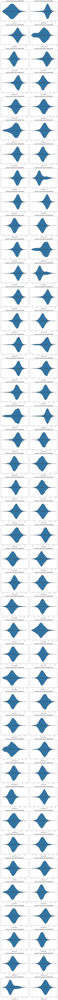

In [38]:
def subplots(columns,dataframe):
    #size = len(columns) // 2
    num_columns = len(columns)
    size = len(columns) // 2 + len(columns) % 2
    fig, axes = plt.subplots(size, 2, figsize=(10, 4 * size))
    axes = axes.flatten()

    for i, col in enumerate(columns):
      sns.violinplot(x=dataframe[col],ax=axes[i]).set_title(f' number of observations {col}')


    if num_columns % 2 != 0:
        fig.delaxes(axes[-1])

    plt.tight_layout()
    plt.show()

subplots(df_log.columns,df_log)




## 2. Square root  transform 

In [39]:
import numpy as np
import pandas as pd

def sqr_transform(col_values):
    return np.sqrt(col_values)

columns_to_transform = a.columns.to_list()
df_sqr = a.copy()

for column in columns_to_transform:
    df_sqr[column] = sqr_transform(df_sqr[column])


df_sqr.head()


Geo_accession,GSM742944,GSM2326089,GSM1807974,GSM1807990,GSM2055788,GSM2142335,GSM1807979,GSM1695909,GSM1554468,GSM1695910,...,GSM1662702,GSM1960357,GSM1548458,GSM1548464,GSM2199510,GSM1960356,GSM2199515,GSM1417182,GSM1505571,GSM1554467
A1BG,NaN,2.126450,3.060094,2.764858,3.137202,2.282430,2.922584,3.359356,2.715627,3.174240,...,1.770733,3.042098,3.376283,2.354820,2.984653,3.162676,3.069958,2.625191,2.341964,2.700307
A1CF,NaN,1.683215,2.941915,2.488856,3.090196,1.268636,2.978531,3.037598,2.341964,3.046563,...,1.338566,2.992889,3.054329,2.810609,2.685297,3.003255,2.776483,2.690846,2.202732,2.346344
A2M,2.959408,2.391031,3.252413,3.003979,3.149032,2.138857,3.195519,3.324995,2.944238,3.369363,...,2.131501,3.281287,3.378073,2.835739,3.122488,3.367403,2.947961,2.777932,3.069524,2.945981
A2ML1,NaN,1.758136,1.548514,0.832555,1.914043,1.442027,1.177410,1.482304,1.268636,1.861649,...,1.048147,1.548514,1.268636,1.517427,1.048147,1.962179,1.177410,1.920646,1.665109,1.177410
A2MP1,NaN,1.048147,2.262298,1.394959,1.945299,1.645615,1.665109,2.027529,0.832555,2.486380,...,NaN,2.145966,2.268809,1.715937,1.869895,1.972770,1.987774,1.548514,2.754507,1.048147


In [40]:
# droping the nan values
df_sqr = df_sqr.dropna()

In [41]:
df_sqr.describe()

Geo_accession,GSM742944,GSM2326089,GSM1807974,GSM1807990,GSM2055788,GSM2142335,GSM1807979,GSM1695909,GSM1554468,GSM1695910,...,GSM1662702,GSM1960357,GSM1548458,GSM1548464,GSM2199510,GSM1960356,GSM2199515,GSM1417182,GSM1505571,GSM1554467
count,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,...,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000,1229.000000
mean,1.650534,2.793267,2.596575,1.913577,2.564172,2.562744,2.447819,2.646033,2.316919,2.780801,...,2.070102,2.501228,2.696175,2.603436,2.244006,2.577796,2.343776,2.548089,1.988403,2.318664
std,0.541473,0.289362,0.214225,0.630552,0.197679,0.281669,0.277070,0.229829,0.266694,0.179089,...,0.487599,0.204069,0.196191,0.208930,0.251508,0.197162,0.244528,0.206460,0.503864,0.276274
min,0.000000,0.832555,1.338566,0.000000,1.442027,0.832555,0.000000,1.576359,0.832555,2.046865,...,0.000000,1.576359,1.893018,1.576359,0.832555,1.576359,1.338566,1.442027,0.000000,0.000000
25%,1.394959,2.715396,2.488856,1.744856,2.438323,2.451789,2.331035,2.519055,2.174256,2.674665,...,1.861649,2.372261,2.573209,2.488034,2.102104,2.452288,2.209706,2.421494,1.700109,2.176281
50%,1.730818,2.841593,2.620880,2.081041,2.571650,2.597386,2.495303,2.656184,2.335663,2.789319,...,2.121275,2.504571,2.705647,2.628831,2.259634,2.583273,2.358924,2.550351,1.927063,2.344604
75%,2.010734,2.952239,2.727124,2.321437,2.693620,2.740616,2.613387,2.790514,2.488446,2.895100,...,2.356472,2.633324,2.828903,2.739716,2.411251,2.707472,2.506818,2.676844,2.233928,2.494906
max,2.840493,3.415306,3.142686,2.980497,3.430834,3.179593,3.098531,3.475868,3.066959,3.353848,...,3.347600,3.436750,3.429741,3.175383,3.139932,3.486691,3.271952,3.297701,3.413509,3.073275


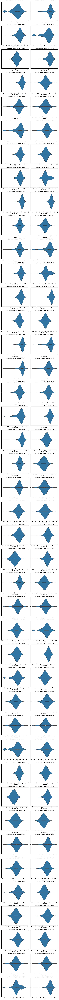

In [42]:
subplots(df_log.columns,df_sqr)

In [43]:
def subplots_hist(columns,dataframe):
    #size = len(columns) // 2
    num_columns = len(columns)
    size = len(columns) // 2 + len(columns) % 2
    fig, axes = plt.subplots(size, 2, figsize=(10, 4 * size))
    axes = axes.flatten()

    for i, col in enumerate(columns):
      sns.histplot(data=dataframe, x=col, kde=True,bins=40,edgecolor='black',ax=axes[i]).set_title(f' number of observations {col}')



    if num_columns % 2 != 0:
        fig.delaxes(axes[-1])

    plt.tight_layout()
    plt.show()


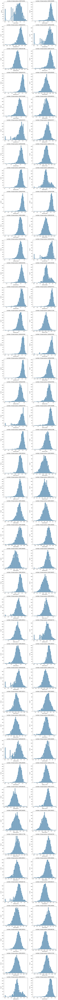

In [44]:
subplots_hist(df_sqr.columns,df_sqr)

# Transposing the dataframe

In [45]:
df_sqr = df_sqr.T

print(df_sqr.columns)


Index(['AACS', 'AAK1', 'AARS', 'ABAT', 'ABCA9', 'ABCC4', 'ABCC9', 'ABCF2',
       'ABHD18', 'ABI2',
       ...
       'RNF6', 'RNFT1', 'RNMT', 'ROCK1', 'RORA', 'RP11-286N22.8',
       'RP11-568K15.1', 'RPA1', 'RPAP1', 'RPL28'],
      dtype='object', length=1229)


# Merging the two dataframe

In [46]:
df = samples_df.merge(df_sqr, how='inner',on="Geo_accession")
shape = df.shape

print("The Total rows(samples) :",shape[0])
print("The Total columns(genes + categorical columns ) :",shape[1])

The Total rows(samples) : 84
The Total columns(genes + categorical columns ) : 1244


In [47]:
df.head()

,Geo_accession,Source,Series_id,Platform_id,Organism,Molecule,Library_strategy,Library_source,Library_selection,Submission_date,...,RNF6,RNFT1,RNMT,ROCK1,RORA,RP11-286N22.8,RP11-568K15.1,RPA1,RPAP1,RPL28
0,GSM2142335,17 week humn fetal liver sorted form haematopo...,GSE81080,GPL11154,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,May 03 2016,...,2.484291,2.329152,2.721639,2.812577,2.268809,2.309268,2.150575,2.604482,2.617881,3.179593
1,GSM1662558,292-Liver-KRAS,GSE68086,GPL16791,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,Apr 21 2015,...,2.320451,2.233928,2.280021,2.591406,1.517427,1.885563,2.227744,2.999834,0.832555,2.655370
2,GSM1662702,297-Liver-WT,GSE68086,GPL16791,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,Apr 21 2015,...,2.386154,2.207985,1.967537,2.404318,1.394959,1.967537,2.343728,3.012547,1.624518,2.536641
3,GSM1662559,316-Liver-KRAS,GSE68086,GPL16791,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,Apr 21 2015,...,2.541634,1.442027,1.442027,2.514828,1.900242,1.394959,2.128990,2.844686,0.000000,2.360541
4,GSM1662560,341-Liver-WT,GSE68086,GPL16791,Homo sapiens,total RNA,RNA-Seq,transcriptomic,cDNA,Apr 21 2015,...,2.502678,2.015054,1.758136,2.541017,1.914043,1.576359,2.046865,2.969443,1.815444,2.505698
